### Reqirements
- keras >= 2.2.0 or tensorflow >= 1.13
- segmenation-models==1.0.*
- albumentations==0.3.0

# Loading dataset

For this example we will use **CamVid** dataset. It is a set of:
 - **train** images + segmentation masks
 - **validation** images + segmentation masks
 - **test** images + segmentation masks
 
All images have 320 pixels height and 480 pixels width.
For more inforamtion about dataset visit http://mi.eng.cam.ac.uk/research/projects/VideoRec/CamVid/.

In [1]:
import os
from glob import glob

import cv2
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

2022-11-16 14:39:30.994395: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-16 14:39:31.526631: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-16 14:39:32.459334: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/nkspartan/miniconda3/envs/tf-gpu/lib/python3.10/site-packages/cv2/../../lib64::/home/nkspartan/miniconda3/envs/tf-gpu/lib/
2022-11-16 14:39:32.459412: W tensorflow/stream_executor/platform/default/dso_loade

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)

2022-11-16 14:39:34.198419: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-16 14:39:34.217157: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-16 14:39:34.217398: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [3]:
DATA_DIR = './dataset/dataset_v1'

In [4]:
x_train_dir = os.path.join(DATA_DIR, 'train/images')
y_train_dir = os.path.join(DATA_DIR, 'train/masks')

x_valid_dir = os.path.join(DATA_DIR, 'validation/images')
y_valid_dir = os.path.join(DATA_DIR, 'validation/masks')

x_test_dir = os.path.join(DATA_DIR, 'test/images')
y_test_dir = os.path.join(DATA_DIR, 'test/masks')

# Dataloader and utility functions 

In [40]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x
    

# classes for data loading and preprocessing
class Dataset:
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
    CLASSES = ['river', 'not_river']
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            classes=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [str(i) for i in glob(images_dir + '/*')]
        self.masks_fps = [str(i) for i in glob(masks_dir + '/*')]
        self.images_fps.sort()
        self.masks_fps.sort()

        # convert str names to class values on masks
        self.class_values = classes
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.resize(image, (320, 320), interpolation = cv2.INTER_AREA)
        mask = cv2.imread(self.masks_fps[i])
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        mask = cv2.resize(mask, (320, 320), interpolation = cv2.INTER_AREA)
        mask = np.expand_dims(mask, axis=-1)
        mask = mask.astype('float')
        
        # extract certain classes from mask (e.g. cars)
        #masks = [(mask == v) for v in self.class_values]
        #mask = np.stack(masks, axis=-1).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)
    
    
class Dataloder(keras.utils.Sequence):
    """Load data from dataset and form batches
    
    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return batch
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)   

(320, 320, 1)
[[[186 178 146]
  [186 180 146]
  [186 180 146]
  ...
  [174 164 146]
  [173 168 142]
  [170 172 137]]

 [[185 178 145]
  [186 179 146]
  [186 179 146]
  ...
  [173 164 145]
  [169 168 143]
  [164 172 139]]

 [[184 177 144]
  [186 179 146]
  [186 179 146]
  ...
  [171 166 142]
  [163 169 143]
  [155 172 141]]

 ...

 [[ 41  87  75]
  [ 51  95  82]
  [ 40  80  68]
  ...
  [ 53  82  75]
  [ 67  85  82]
  [ 49  77  73]]

 [[ 50  93  76]
  [ 57 100  82]
  [ 46  86  69]
  ...
  [ 61  88  78]
  [ 76 105  97]
  [ 45  74  67]]

 [[ 47  90  70]
  [ 60 101  81]
  [ 51  89  71]
  ...
  [ 56  87  76]
  [ 47  89  77]
  [ 35  66  57]]]
[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]


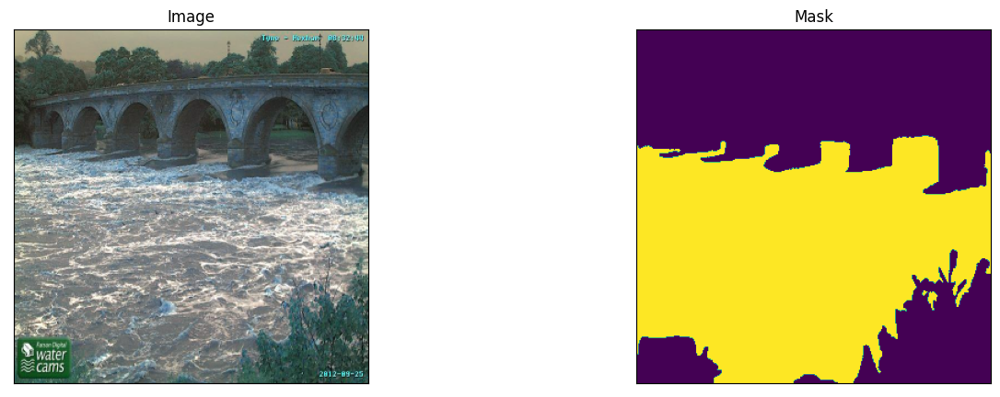

In [7]:
# Lets look at data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=[0, 1])

image, mask = dataset[5] # get some sample
print(mask.shape)
visualize(
    image=image, 
    mask=mask
)

### Augmentations

Data augmentation is a powerful technique to increase the amount of your data and prevent model overfitting.  
If you not familiar with such trick read some of these articles:
 - [The Effectiveness of Data Augmentation in Image Classification using Deep
Learning](http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf)
 - [Data Augmentation | How to use Deep Learning when you have Limited Data](https://medium.com/nanonets/how-to-use-deep-learning-when-you-have-limited-data-part-2-data-augmentation-c26971dc8ced)
 - [Data Augmentation Experimentation](https://towardsdatascience.com/data-augmentation-experimentation-3e274504f04b)

Since our dataset is very small we will apply a large number of different augmentations:
 - horizontal flip
 - affine transforms
 - perspective transforms
 - brightness/contrast/colors manipulations
 - image bluring and sharpening
 - gaussian noise
 - random crops

All this transforms can be easily applied with [**Albumentations**](https://github.com/albu/albumentations/) - fast augmentation library.
For detailed explanation of image transformations you can look at [kaggle salt segmentation exmaple](https://github.com/albu/albumentations/blob/master/notebooks/example_kaggle_salt.ipynb) provided by [**Albumentations**](https://github.com/albu/albumentations/) authors.


In [9]:
import albumentations as A

In [10]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# define heavy augmentations
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

        A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        A.RandomCrop(height=320, width=320, always_apply=True),

        A.GaussNoise(p=0.2),
        A.Perspective(p=0.5),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.Sharpen(p=1),
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
        A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(384, 480)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

/home/nkspartan/miniconda3/envs/tf-gpu/lib/python3.10/site-packages/albumentations/augmentations/transforms.py:1149: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/home/nkspartan/miniconda3/envs/tf-gpu/lib/python3.10/site-packages/albumentations/augmentations/transforms.py:1175: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


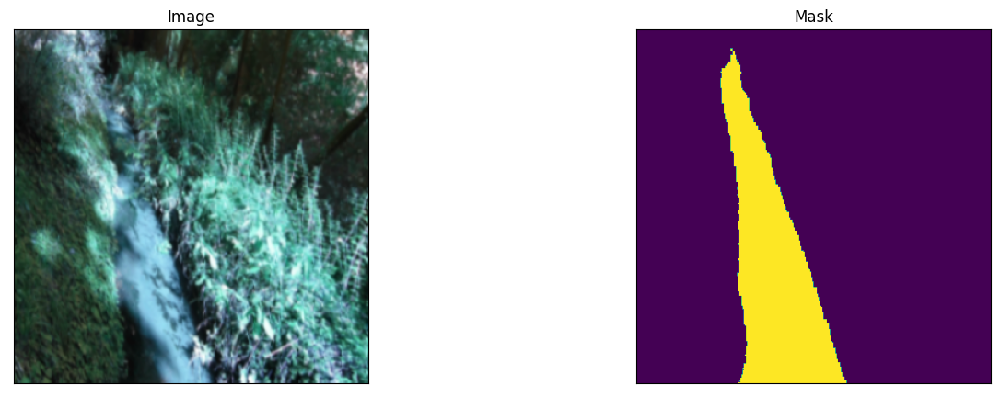

In [9]:
# Lets look at augmented data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=[0, 1], augmentation=get_training_augmentation())

image, mask = dataset[12] # get some sample
visualize(
    image=image, 
    mask=mask
)

# Segmentation model training

In [13]:
import segmentation_models as sm

# segmentation_models could also use `tf.keras` if you do not have Keras installed
# or you could switch to other framework using `sm.set_framework('tf.keras')`

Segmentation Models: using `keras` framework.


In [14]:
BACKBONE = 'resnet50'
BATCH_SIZE = 8
CLASSES = [1]
LR = 0.0001
EPOCHS = 70

preprocess_input = sm.get_preprocessing(BACKBONE)

In [16]:
# define network parameters
n_classes = 1  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

2022-11-16 14:41:18.967332: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-16 14:41:18.968048: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-16 14:41:18.968295: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-16 14:41:18.968443: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

In [13]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                                3)                                                          

In [29]:
# define optomizer
optim = keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)

In [18]:
import datetime

date_actual = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = "logs/fit/" + date_actual
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=f"model_weights/{date_actual}_segmentation_best_weights.hdf5",
                               monitor='val_loss',
                               verbose=1,
                               save_weights_only=True,
                               save_best_only=True)

In [19]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=[0, 1], 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=[0, 1], 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    checkpoint_callback,
    es_callback,
    tensorboard_callback,
    keras.callbacks.ReduceLROnPlateau(),
]

In [17]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader, 
    validation_steps=len(valid_dataloader),
)

Epoch 1/70


2022-11-16 10:37:39.436691: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2022-11-16 10:37:40.717463: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-11-16 10:37:40.718252: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-11-16 10:37:40.718268: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-11-16 10:37:40.719371: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-11-16 10:37:40.719418: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-11-16 10:37:41.603375: W tensorflow/core/common_runtime/bf

98/98 [==============================] - ETA: 0s - loss: 0.6027 - iou_score: 0.4881 - f1-score: 0.6411
Epoch 1: val_loss improved from inf to 0.70089, saving model to model_weights/20221116-103732_segmentation_best_weights.hdf5


2022-11-16 10:38:28.121894: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 566231040 exceeds 10% of free system memory.
2022-11-16 10:38:28.381406: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 503316480 exceeds 10% of free system memory.
2022-11-16 10:38:28.672528: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 566231040 exceeds 10% of free system memory.
2022-11-16 10:38:29.056211: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 566231040 exceeds 10% of free system memory.
2022-11-16 10:38:29.375675: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1698693120 exceeds 10% of free system memory.


98/98 [==============================] - 57s 456ms/step - loss: 0.6027 - iou_score: 0.4881 - f1-score: 0.6411 - val_loss: 0.7009 - val_iou_score: 0.5149 - val_f1-score: 0.6525 - lr: 1.0000e-04
Epoch 2/70
98/98 [==============================] - ETA: 0s - loss: 0.4630 - iou_score: 0.6071 - f1-score: 0.7470
Epoch 2: val_loss improved from 0.70089 to 0.51073, saving model to model_weights/20221116-103732_segmentation_best_weights.hdf5
98/98 [==============================] - 45s 459ms/step - loss: 0.4630 - iou_score: 0.6071 - f1-score: 0.7470 - val_loss: 0.5107 - val_iou_score: 0.6225 - val_f1-score: 0.7421 - lr: 1.0000e-04
Epoch 3/70
98/98 [==============================] - ETA: 0s - loss: 0.3984 - iou_score: 0.6526 - f1-score: 0.7828
Epoch 3: val_loss improved from 0.51073 to 0.46837, saving model to model_weights/20221116-103732_segmentation_best_weights.hdf5
98/98 [==============================] - 44s 449ms/step - loss: 0.3984 - iou_score: 0.6526 - f1-score: 0.7828 - val_loss: 0.4684

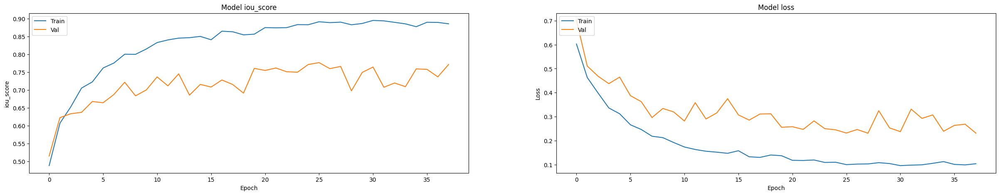

In [18]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Model Evaluation

In [41]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    #augmentation=get_validation_augmentation(),
    #preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [42]:
print(date_actual)

20221116-144130


In [45]:
# load best weights
#model.load_weights(f'model_weights/{date_actual}_segmentation_best_weights.hdf5')

model.load_weights("best_model_weights/seg_model_resnet_50_1.hdf5")

In [46]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

[[[ 39  75  69]
  [ 42  81  74]
  [ 51  94  87]
  ...
  [235 255 235]
  [249 255 238]
  [255 254 240]]

 [[ 41  74  69]
  [ 54  89  83]
  [ 54  94  88]
  ...
  [250 255 235]
  [253 255 238]
  [253 255 240]]

 [[ 54  82  77]
  [ 55  86  81]
  [ 45  80  74]
  ...
  [255 253 235]
  [255 255 237]
  [248 255 239]]

 ...

 [[ 33  95  69]
  [ 29  89  66]
  [ 35  93  73]
  ...
  [130 100  77]
  [121  98  82]
  [101 100  90]]

 [[ 32  98  72]
  [ 28  92  70]
  [ 30  92  73]
  ...
  [124 102  76]
  [114 100  83]
  [106  96  88]]

 [[ 33 100  73]
  [ 39 104  82]
  [ 30  92  74]
  ...
  [120 110  82]
  [115 108  91]
  [122  99  94]]]
[[[ 39  75  69]
  [ 42  81  74]
  [ 51  94  87]
  ...
  [235 255 235]
  [249 255 238]
  [255 254 240]]

 [[ 41  74  69]
  [ 54  89  83]
  [ 54  94  88]
  ...
  [250 255 235]
  [253 255 238]
  [253 255 240]]

 [[ 54  82  77]
  [ 55  86  81]
  [ 45  80  74]
  ...
  [255 253 235]
  [255 255 237]
  [248 255 239]]

 ...

 [[ 33  95  69]
  [ 29  89  66]
  [ 35  93  73]
  ..

# Visualization of results on test dataset

[[[ 78 133  84]
  [ 62  98  67]
  [ 46  81  56]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 [[ 61 106  77]
  [ 51  84  58]
  [ 46  77  52]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 [[ 47  79  56]
  [ 45  75  49]
  [ 42  74  48]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 ...

 [[215 225 228]
  [158 196 199]
  [146 176 181]
  ...
  [230 243 241]
  [220 242 240]
  [186 241 238]]

 [[164 190 192]
  [173 207 205]
  [164 194 195]
  ...
  [223 242 239]
  [220 242 240]
  [190 242 236]]

 [[173 189 189]
  [212 216 209]
  [179 208 209]
  ...
  [216 242 239]
  [219 242 240]
  [190 241 232]]]
1/1 [==============================] - 0s 20ms/step


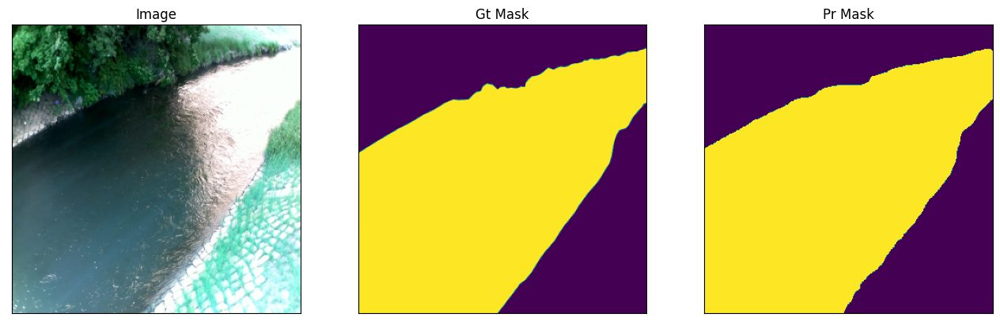

[[[ 70  82  86]
  [ 60  71  75]
  [ 76  89  93]
  ...
  [ 24  52  44]
  [ 22  53  44]
  [ 58  88  74]]

 [[ 78  89  93]
  [ 67  78  82]
  [ 76  88  92]
  ...
  [ 30  62  55]
  [ 17  46  37]
  [ 37  66  58]]

 [[ 69  81  83]
  [ 71  82  86]
  [ 75  87  91]
  ...
  [ 35  70  64]
  [ 29  56  48]
  [ 46  74  69]]

 ...

 [[ 76  74  66]
  [ 53  50  45]
  [ 63  58  55]
  ...
  [ 33  91  82]
  [ 45 111  99]
  [ 63 141 130]]

 [[ 60  59  52]
  [ 44  41  37]
  [ 58  54  50]
  ...
  [ 39  98  92]
  [ 49 117 106]
  [ 64 141 135]]

 [[ 40  40  35]
  [ 43  41  37]
  [ 43  39  35]
  ...
  [ 44 103  97]
  [ 57 121 110]
  [ 51 123 117]]]
1/1 [==============================] - 0s 22ms/step


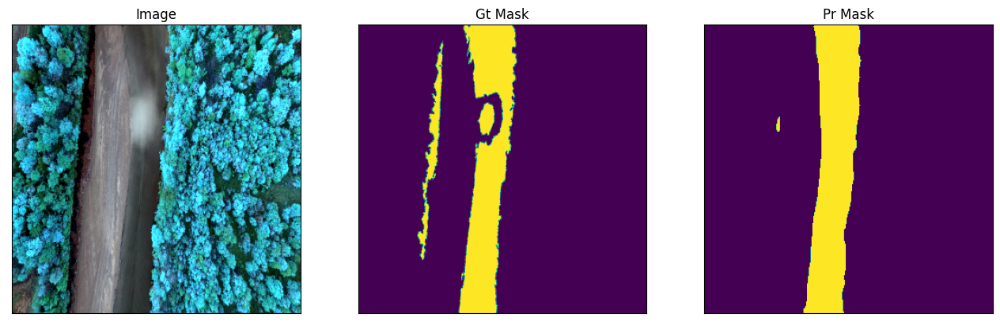

[[[ 36  99 116]
  [ 46 120 143]
  [ 47 127 155]
  ...
  [ 39  88  91]
  [ 56 108 115]
  [ 34  94 100]]

 [[ 64 145 170]
  [ 65 155 183]
  [ 56 145 174]
  ...
  [ 35  85  88]
  [ 32  85  91]
  [ 45 106 111]]

 [[ 50 145 178]
  [ 53 157 190]
  [ 57 155 186]
  ...
  [ 23  72  75]
  [ 25  76  81]
  [ 42 103 106]]

 ...

 [[ 18  57  69]
  [ 52 111 131]
  [ 34 102 124]
  ...
  [ 29 112  96]
  [ 52 138 125]
  [ 38 119 105]]

 [[ 18  37  43]
  [ 26  53  63]
  [ 10  41  53]
  ...
  [  6  33  27]
  [ 10  37  32]
  [ 16  42  36]]

 [[  0   1   0]
  [  1   0   1]
  [  2   0   2]
  ...
  [  0   0   0]
  [  1   0   0]
  [  1   0   0]]]
1/1 [==============================] - 0s 20ms/step


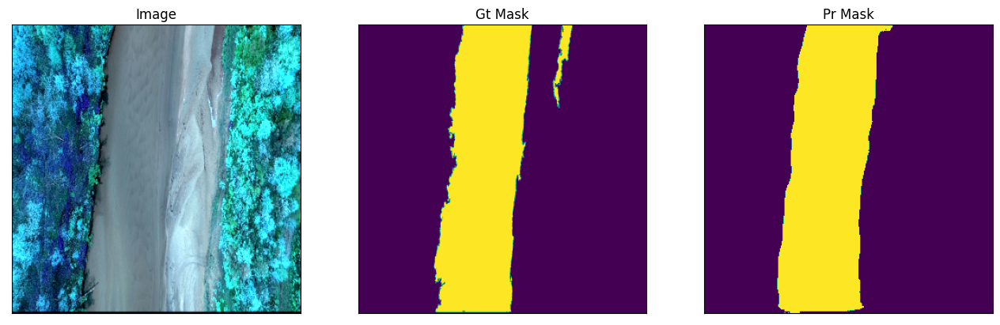

[[[ 43  86  65]
  [ 39  73  45]
  [ 47  79  51]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 [[ 40  80  56]
  [ 33  72  44]
  [ 48  83  56]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 [[ 51  83  58]
  [ 40  76  49]
  [ 49  82  55]
  ...
  [239 242 240]
  [239 242 240]
  [239 242 240]]

 ...

 [[152 175 188]
  [152 177 187]
  [153 179 190]
  ...
  [152 227 208]
  [163 238 221]
  [163 222 205]]

 [[147 179 193]
  [150 177 187]
  [160 188 196]
  ...
  [163 238 218]
  [168 236 217]
  [159 221 202]]

 [[149 195 208]
  [166 190 199]
  [195 208 215]
  ...
  [162 232 212]
  [167 227 204]
  [137 202 182]]]
1/1 [==============================] - 0s 19ms/step


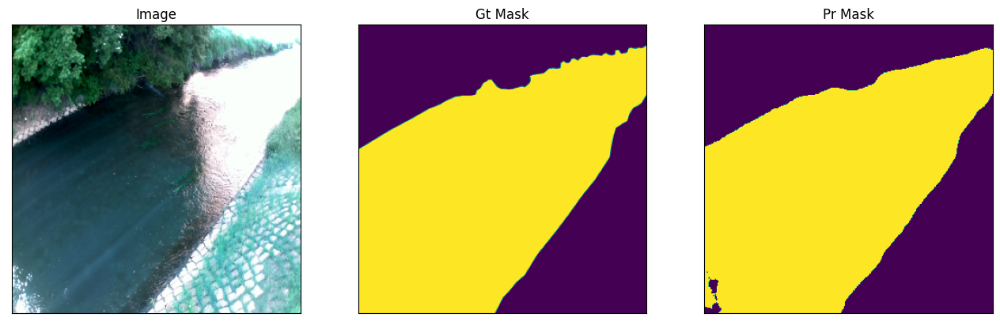

[[[252 251 253]
  [150 148 150]
  [105 102 104]
  ...
  [222 237 255]
  [217 229 247]
  [189 199 223]]

 [[244 243 245]
  [183 181 183]
  [159 157 159]
  ...
  [138 153 174]
  [134 147 168]
  [138 149 171]]

 [[241 239 241]
  [219 217 219]
  [183 180 182]
  ...
  [114 129 150]
  [ 98 111 133]
  [113 124 146]]

 ...

 [[ 71  89 113]
  [ 96 114 138]
  [ 81  98 124]
  ...
  [ 50  47  71]
  [ 60  55  80]
  [ 58  53  77]]

 [[ 63  84 109]
  [ 91 112 137]
  [ 73  93 120]
  ...
  [ 22  19  41]
  [ 41  34  59]
  [ 48  41  64]]

 [[102 124 149]
  [ 68  90 116]
  [ 71  93 120]
  ...
  [ 36  29  55]
  [ 49  40  65]
  [ 49  39  62]]]
1/1 [==============================] - 0s 27ms/step


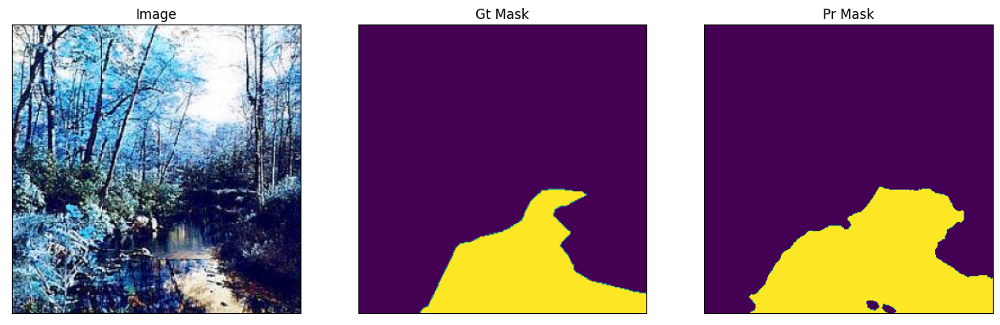

In [44]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:
    
    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

## Visualize with test dataset of images for hydrology project

In [ ]:
test_h_dataset = Dataset(
    "dataset_testing", 
    y_test_dir, 
    classes=CLASSES, 
    #augmentation=get_validation_augmentation(),
    #preprocessing=get_preprocessing(preprocess_input),
)

test_h_dataloader = Dataloder(test_h_dataset, batch_size=1, shuffle=False)

1/1 [==============================] - 0s 21ms/step


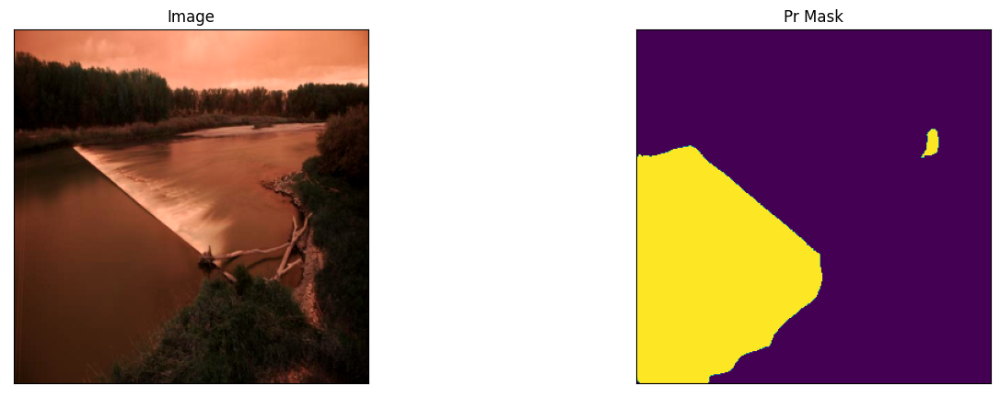

1/1 [==============================] - 0s 24ms/step


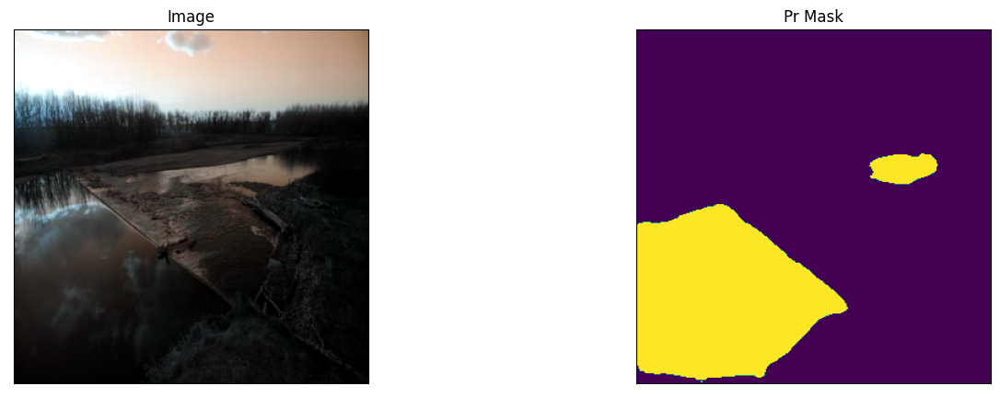

1/1 [==============================] - 0s 21ms/step


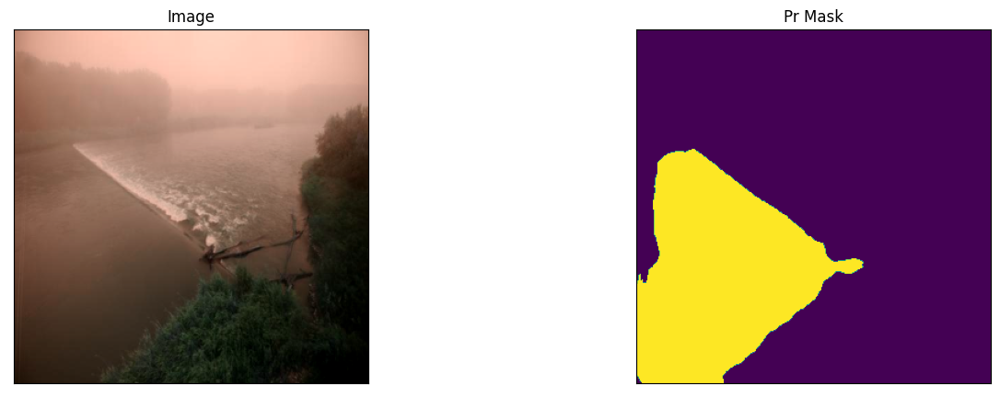

1/1 [==============================] - 0s 25ms/step


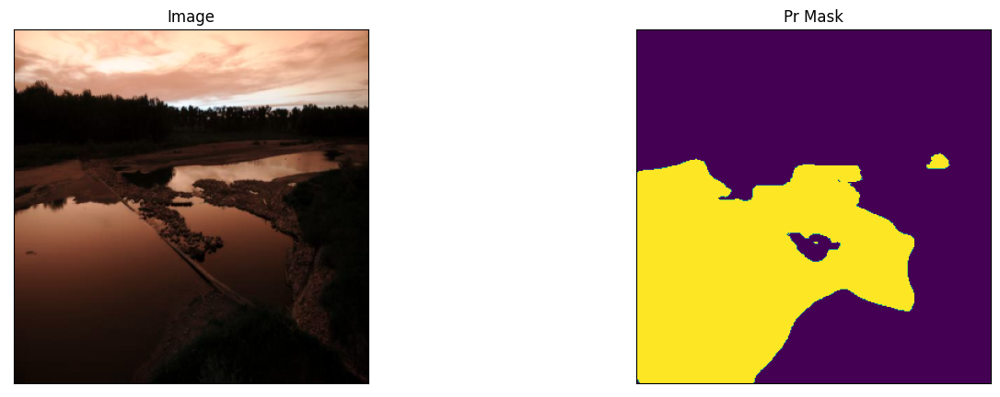

1/1 [==============================] - 0s 24ms/step


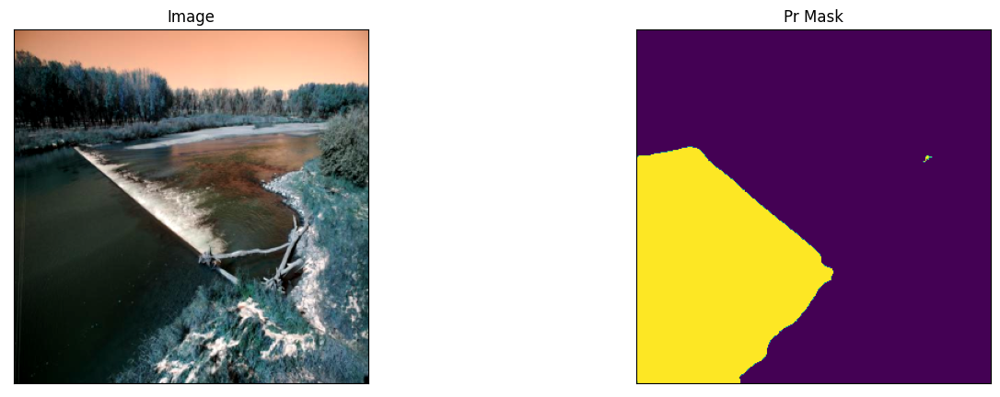

1/1 [==============================] - 0s 24ms/step


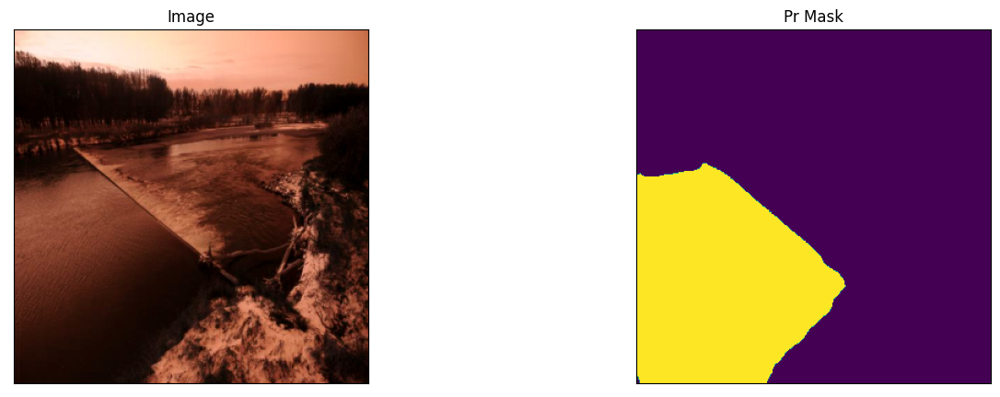

1/1 [==============================] - 0s 20ms/step


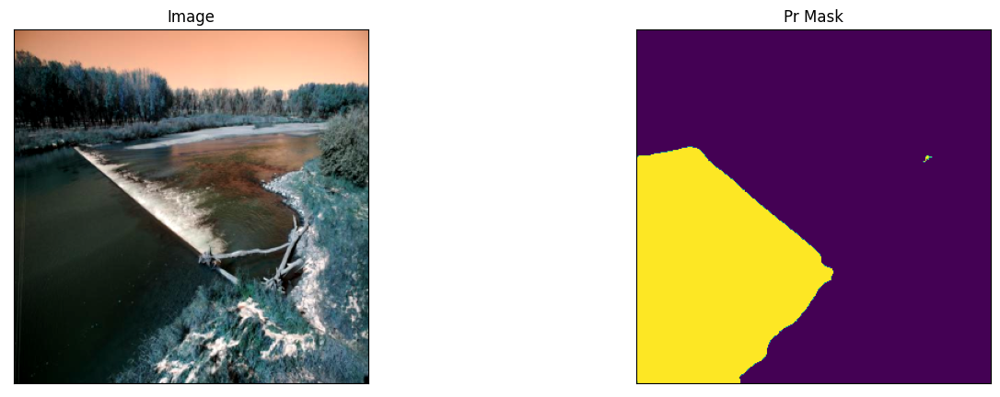

1/1 [==============================] - 0s 28ms/step


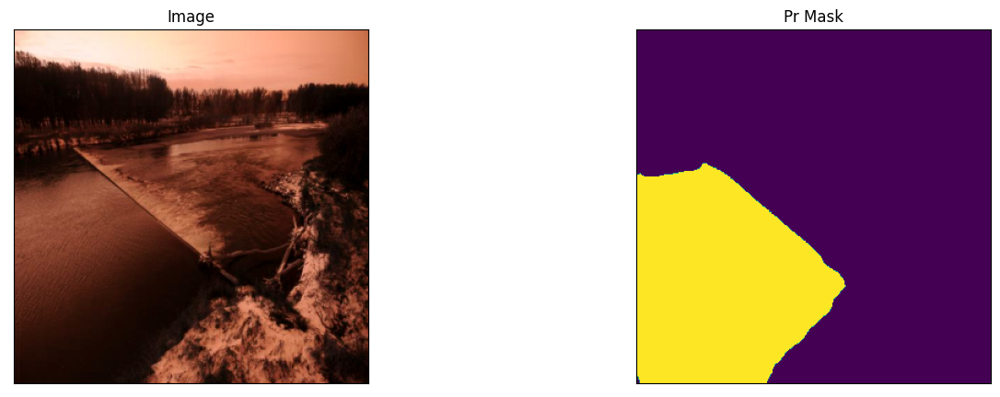

1/1 [==============================] - 0s 22ms/step


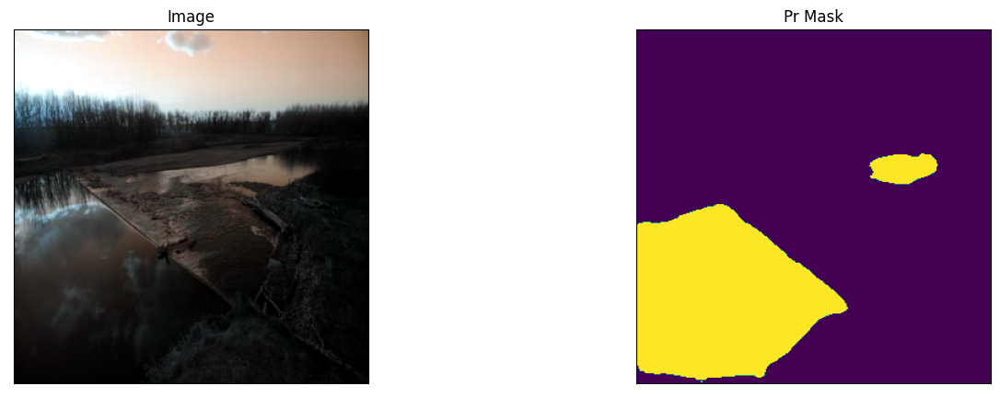

1/1 [==============================] - 0s 21ms/step


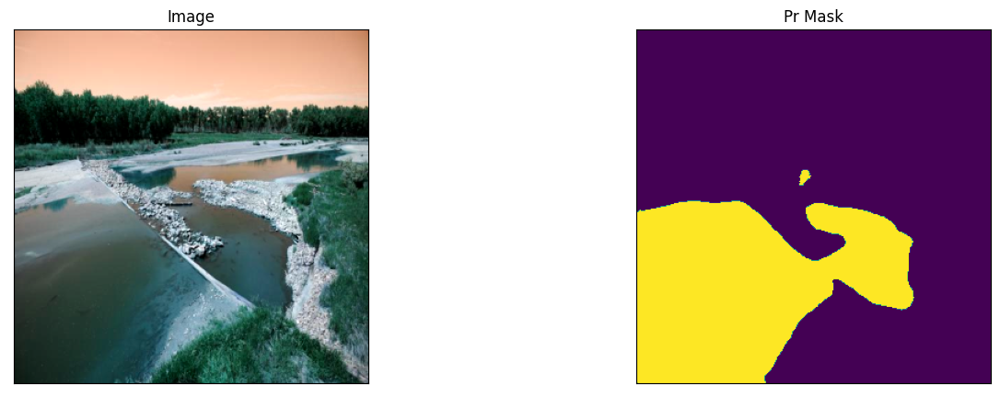

1/1 [==============================] - 0s 26ms/step


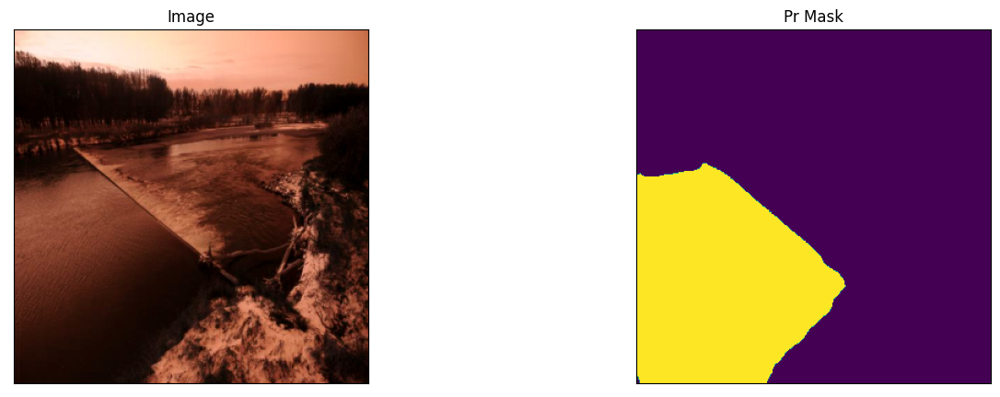

1/1 [==============================] - 0s 28ms/step


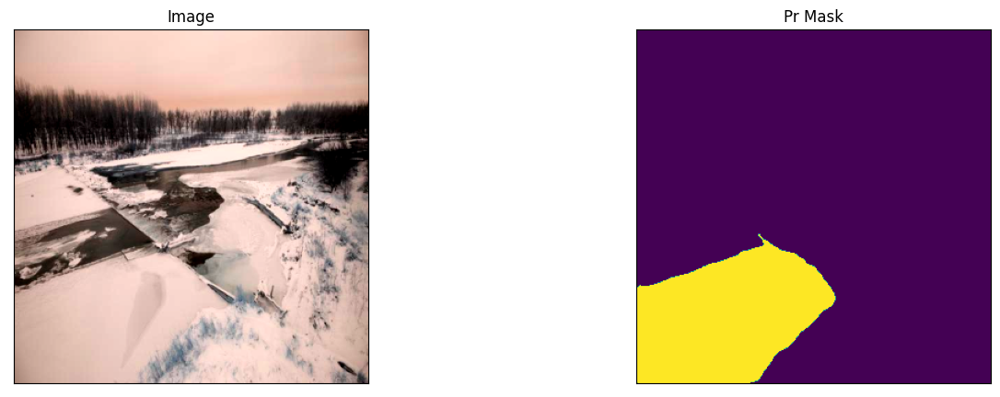

1/1 [==============================] - 0s 25ms/step


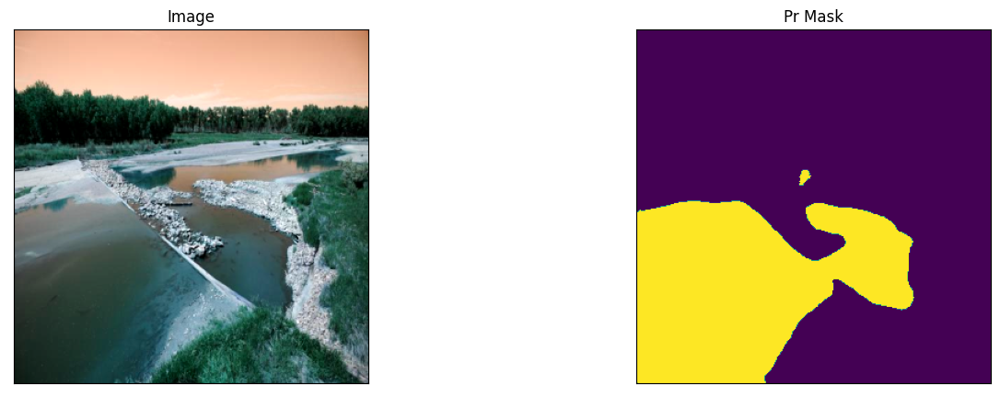

1/1 [==============================] - 0s 24ms/step


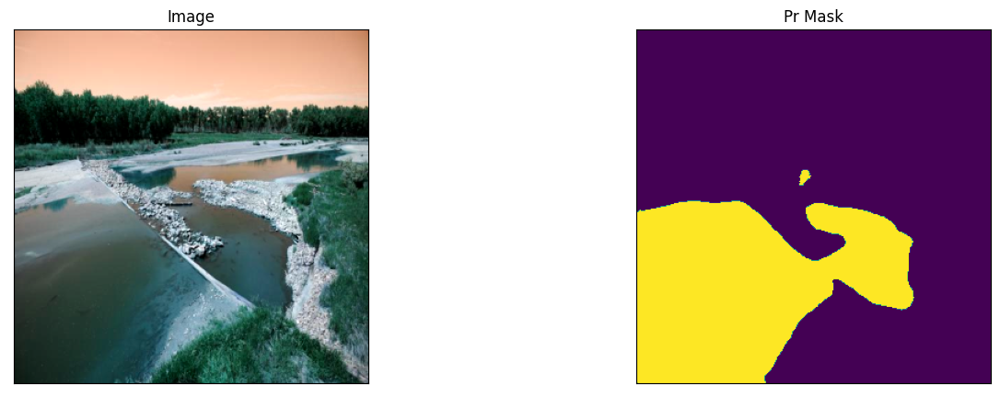

1/1 [==============================] - 0s 26ms/step


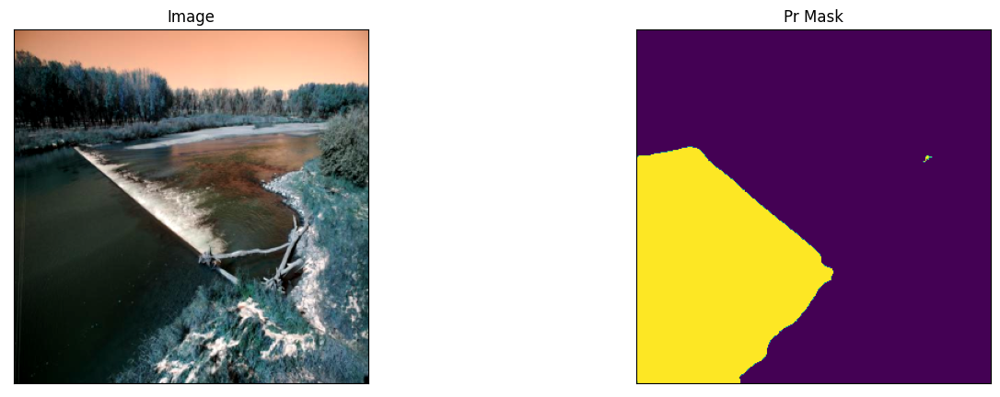

1/1 [==============================] - 0s 23ms/step


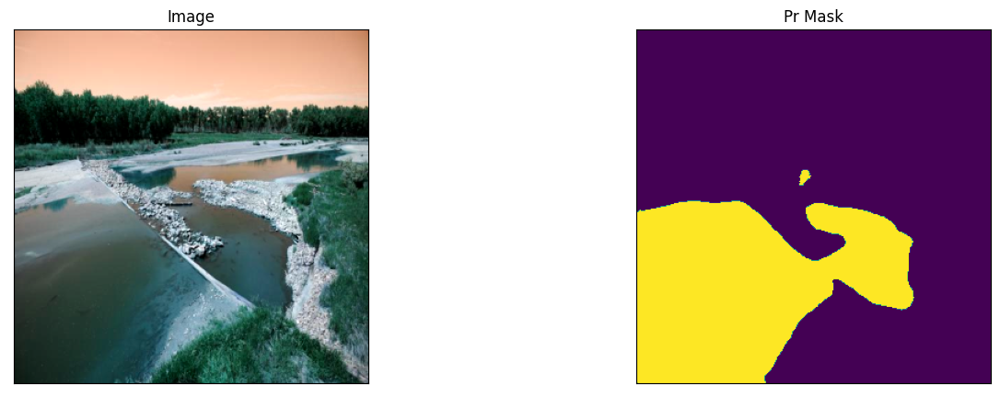

1/1 [==============================] - 0s 24ms/step


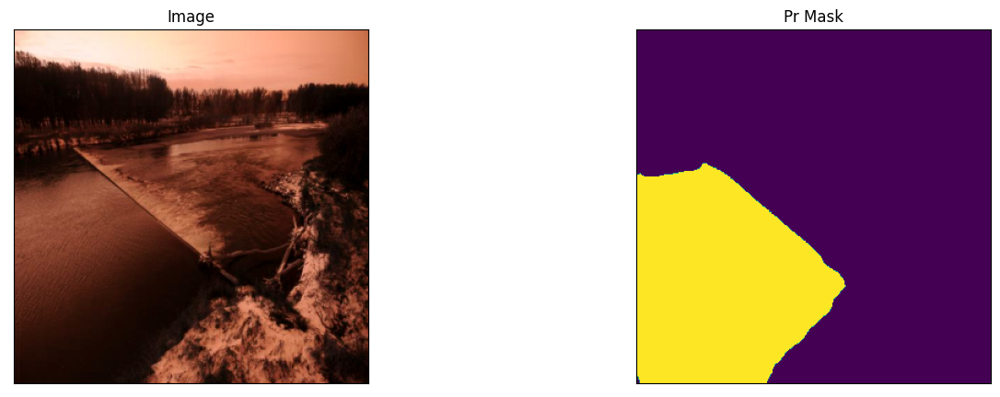

1/1 [==============================] - 0s 25ms/step


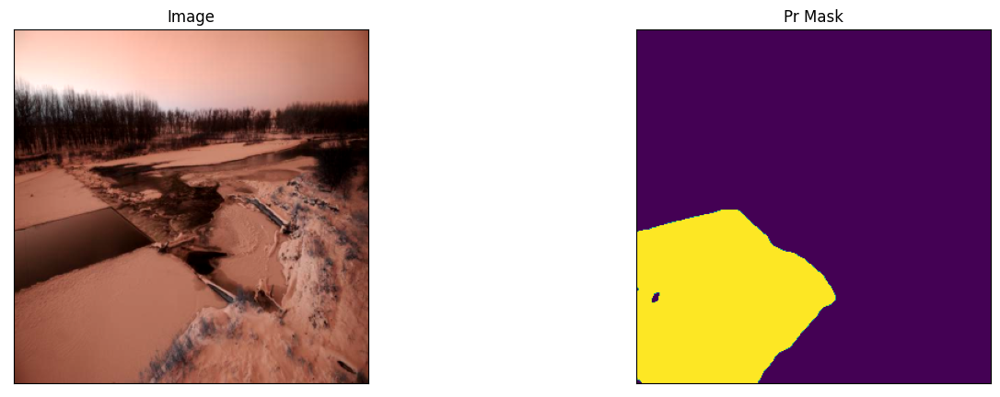

1/1 [==============================] - 0s 27ms/step


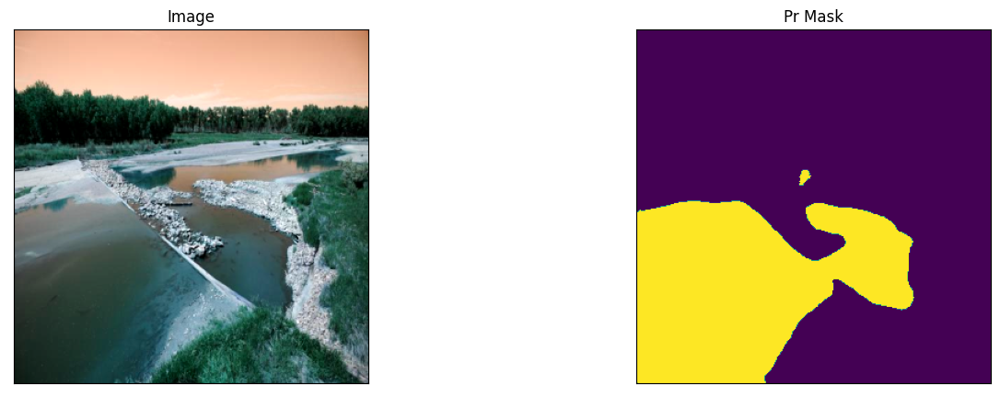

1/1 [==============================] - 0s 31ms/step


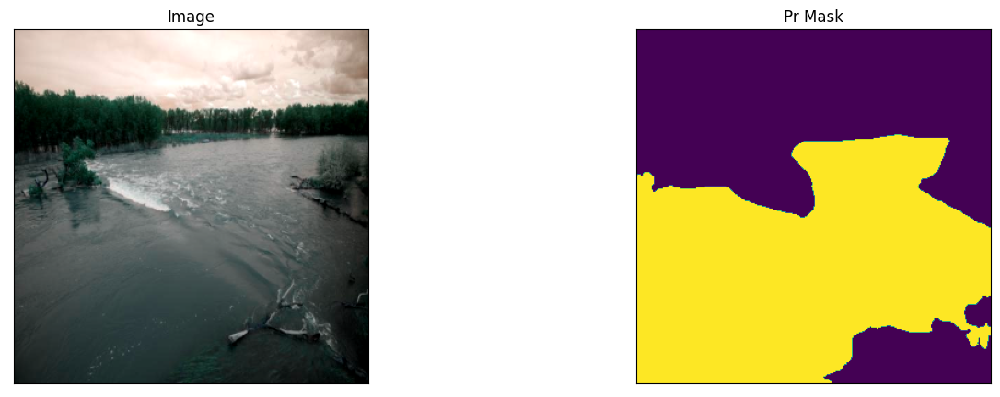

1/1 [==============================] - 0s 27ms/step


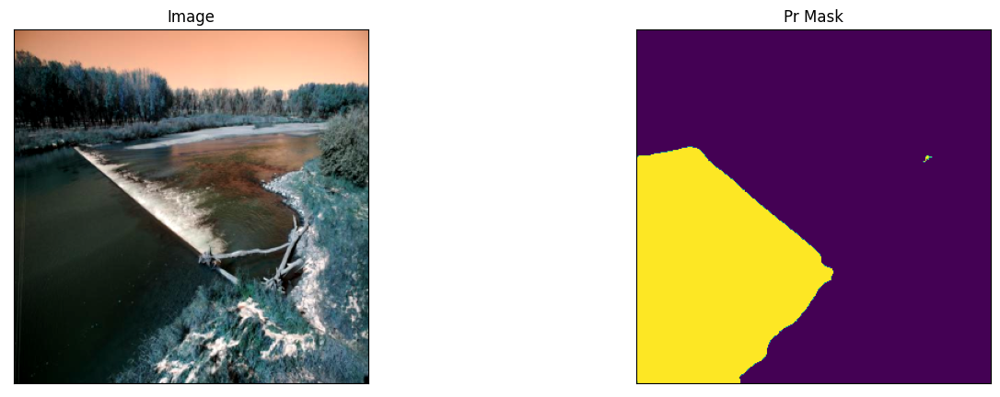

1/1 [==============================] - 0s 36ms/step


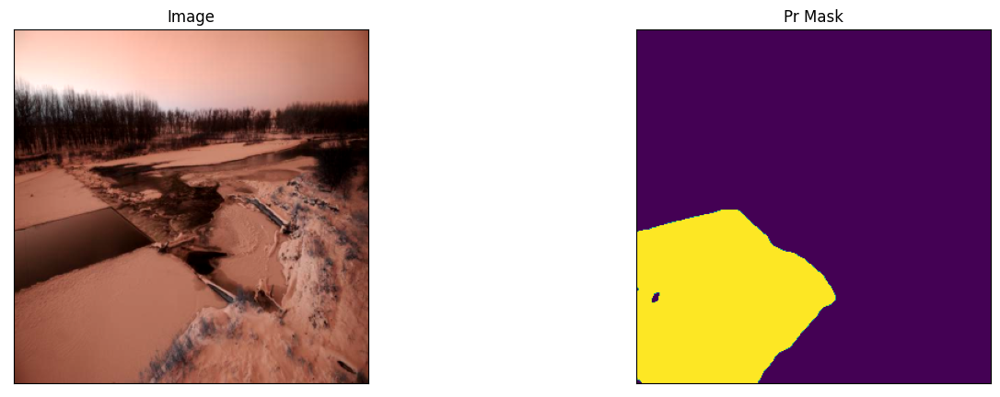

1/1 [==============================] - 0s 34ms/step


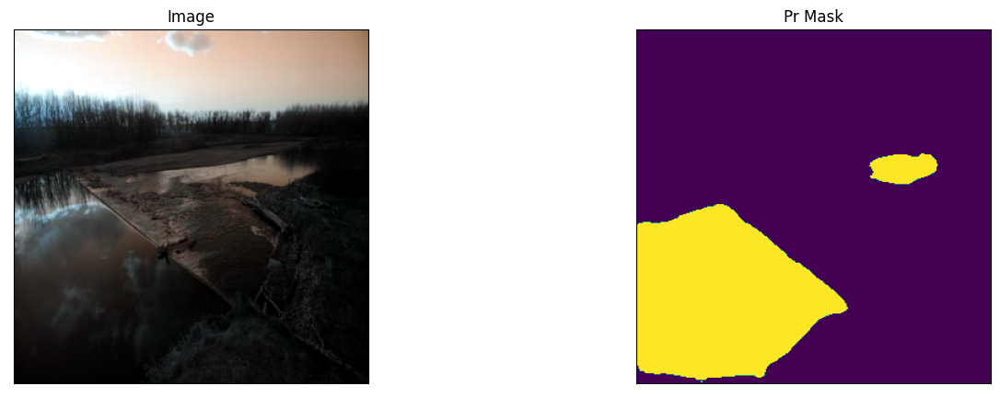

1/1 [==============================] - 0s 28ms/step


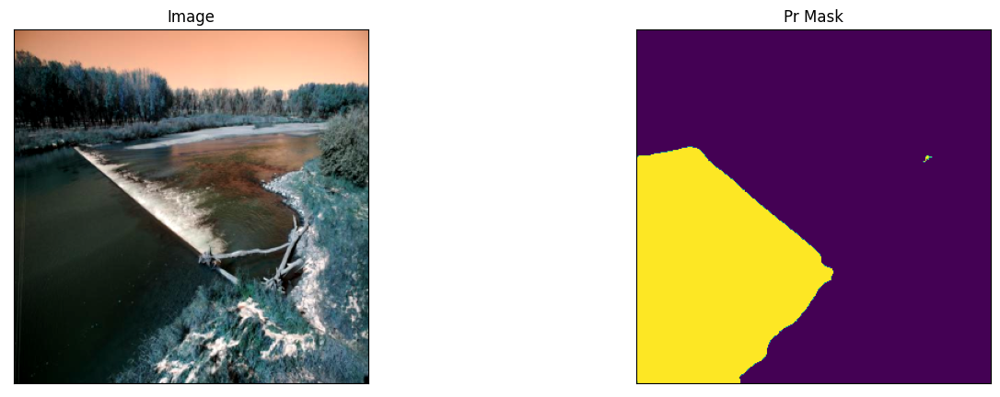

1/1 [==============================] - 0s 41ms/step


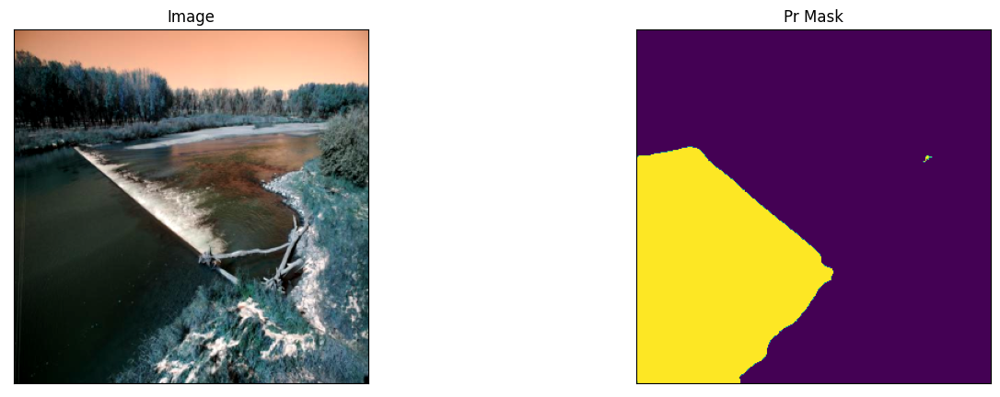

In [ ]:
n = 25
ids = np.random.choice(np.arange(len(test_h_dataset)), size=n)

for i in ids:
    
    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(
        image=denormalize(image.squeeze()),
        pr_mask=pr_mask.squeeze(),
    )